<a href="https://colab.research.google.com/github/AmritangshuM/AI_Projects/blob/main/Control_Net_Deep_learning_project_PS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Deep Learning - ControlNet
---
**MSBA Spring'23**


In [1]:
# installing required libraries
!pip install -q diffusers==0.14.0 transformers xformers git+https://github.com/huggingface/accelerate.git
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 KB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 92.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 MB 34.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 24.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 100.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 KB 5.4 MB/s eta 0:00:00


In [2]:
# importing required libs for images
import cv2
from PIL import Image
import numpy as np

In [3]:
# importing diffusers pipelines
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler, DiffusionPipeline, DPMSolverMultistepScheduler
import torch
from diffusers.utils import load_image

Error caught was: No module named 'triton'


In [4]:
# helper functions - defined here
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

## Stable Diffusion

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

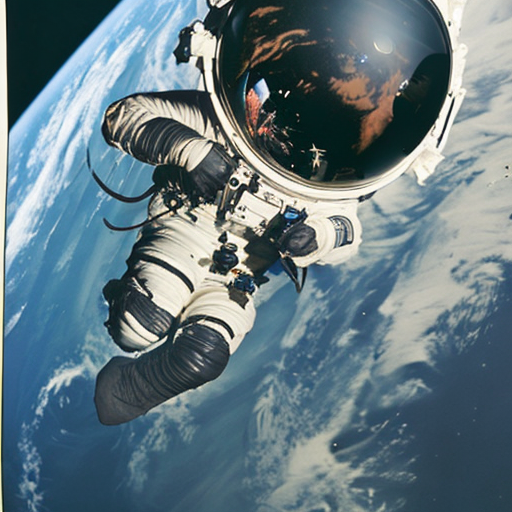

In [5]:
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16, revision="fp16")

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

prompt = "High quality photo of an astronaut riding a horse in space"
image = pipe(prompt, num_inference_steps=25).images[0]
image

## Adding Control to Stable Diffusion (ControlNets)

### Edge Detection

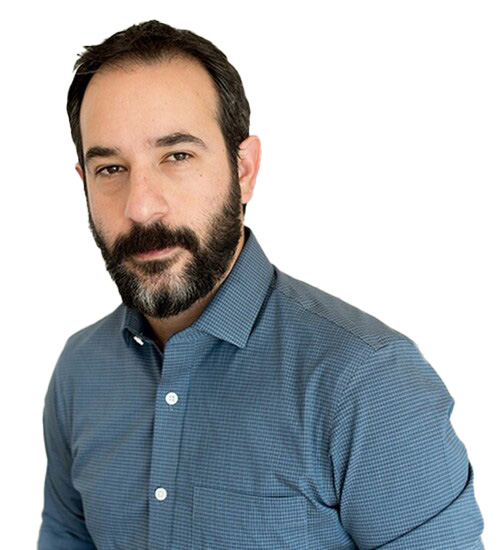

In [6]:
image = load_image(
    "/content/dimakis-alex.jpg"
)
image

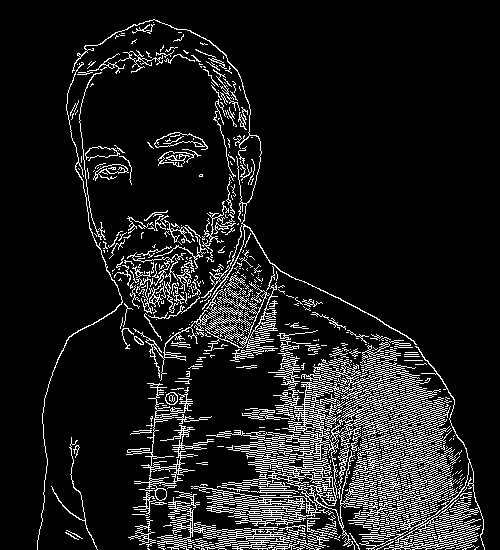

In [7]:
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

In [8]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
)


pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


## Image Generator

  0%|          | 0/20 [00:00<?, ?it/s]

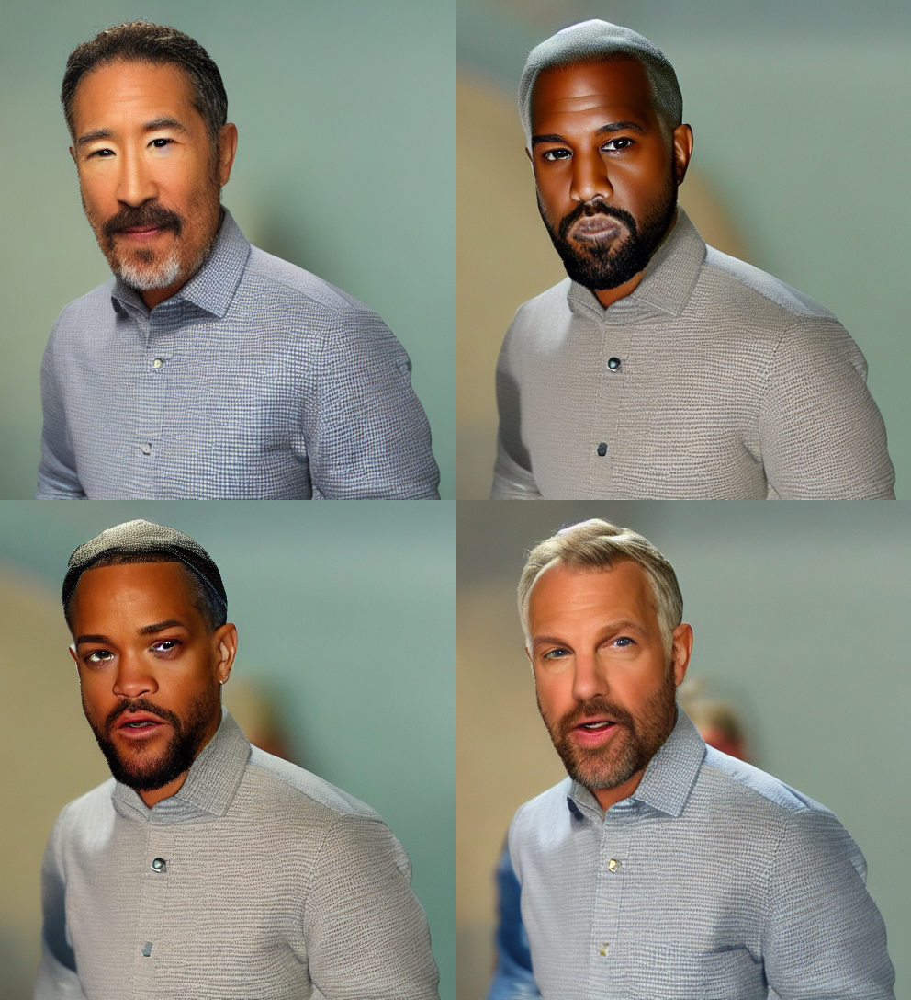

In [9]:
prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Sandra Oh", "Kim Kardashian", "rihanna", "taylor swift"]]
generator = [torch.Generator(device="cpu").manual_seed(2) for i in range(len(prompt))]

output = pipe(
    prompt,
    canny_image,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * len(prompt),
    generator=generator,
    num_inference_steps=20,
)

image_grid(output.images, 2, 2)

  0%|          | 0/20 [00:00<?, ?it/s]

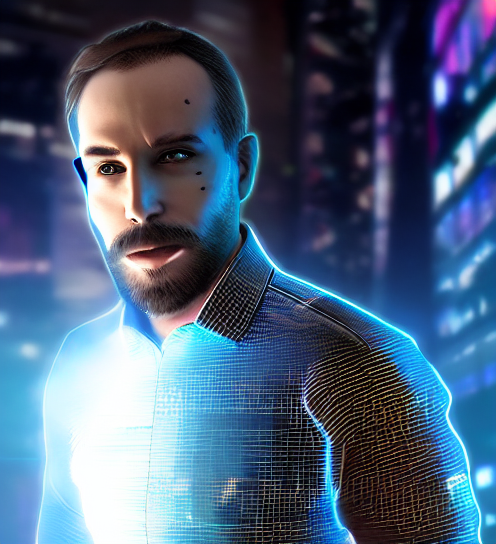

In [10]:
generator = torch.manual_seed(0)

out_image = pipe(
    "cyberpunk style with bionic eye and augmentations", num_inference_steps=20, generator=generator, image=canny_image
).images[0]

out_image

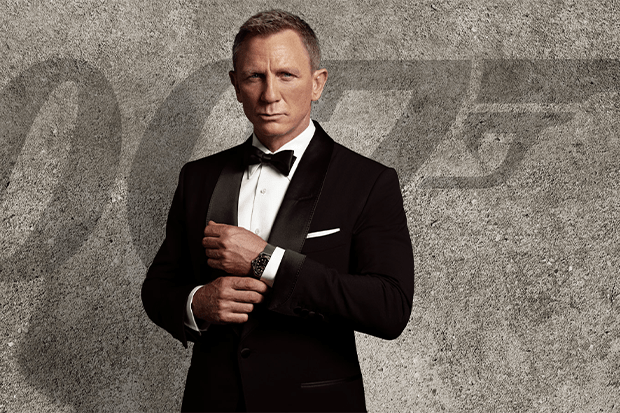

In [11]:
image = load_image(
    "/content/bond_img.png"
)
image

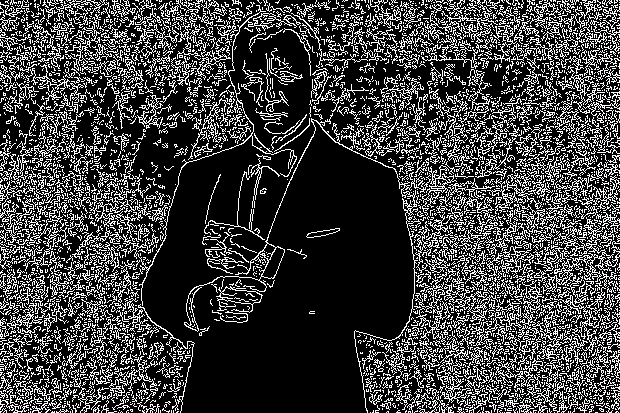

In [12]:
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

  0%|          | 0/20 [00:00<?, ?it/s]

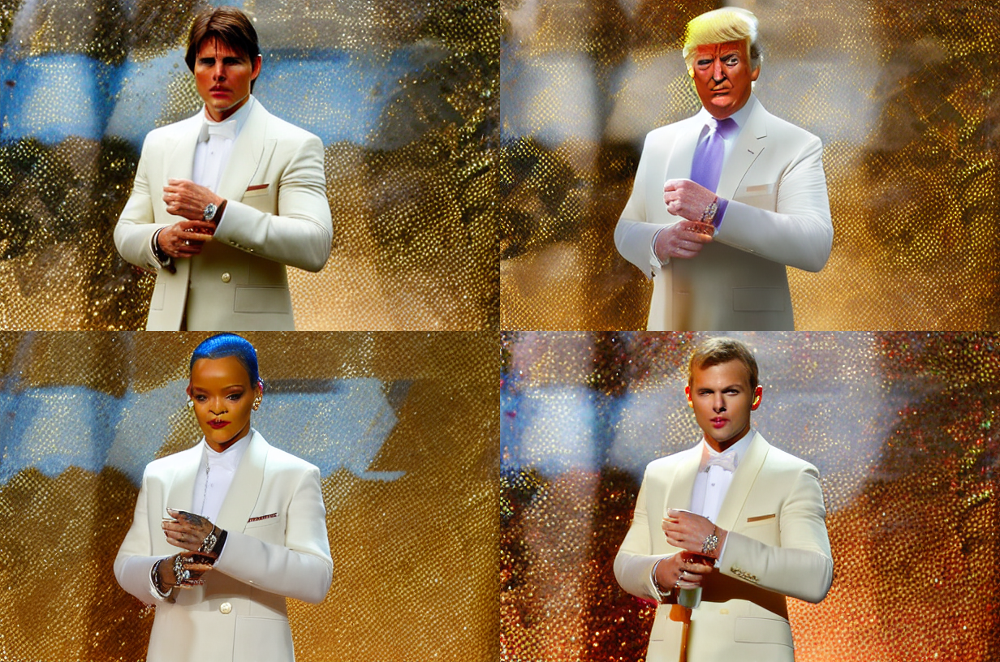

In [13]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Tom Cruise", "Donald Trump", "rihanna", "taylor swift"]]
generator = [torch.Generator(device="cpu").manual_seed(2) for i in range(len(prompt))]

output = pipe(
    prompt,
    canny_image,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * len(prompt),
    generator=generator,
    num_inference_steps=20,
)

image_grid(output.images, 2, 2)

## Pose Detector

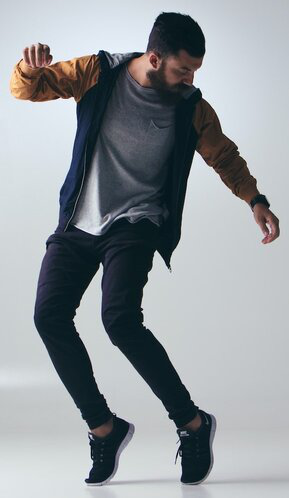

In [14]:
image = load_image(
    "/content/pose_detector.jpg"
)
image

cuda


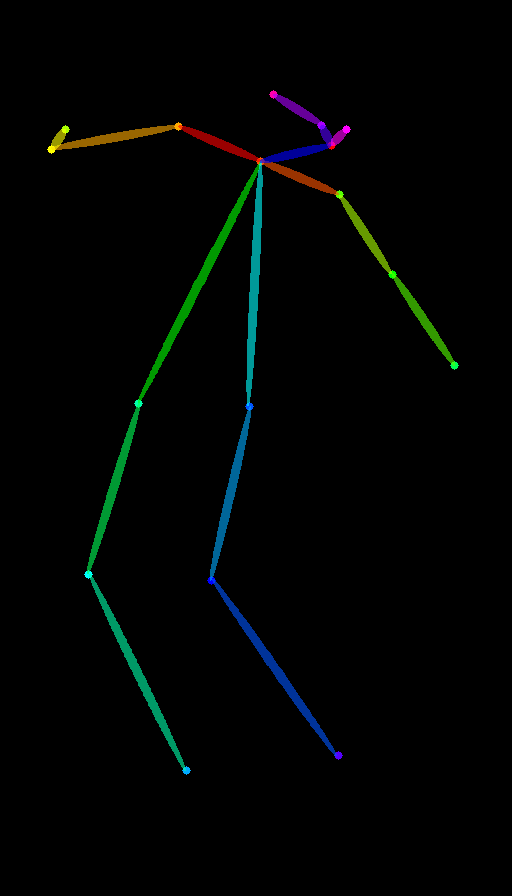

In [15]:
from controlnet_aux import OpenposeDetector

model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

poses = model(image)
#image_grid(poses, 2, 2)
poses

In [16]:
controlnet = ControlNetModel.from_pretrained(
    "fusing/stable-diffusion-v1-5-controlnet-openpose", torch_dtype=torch.float16
)

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


### Pose Detection - superimposed on famous celebrities

  0%|          | 0/40 [00:00<?, ?it/s]

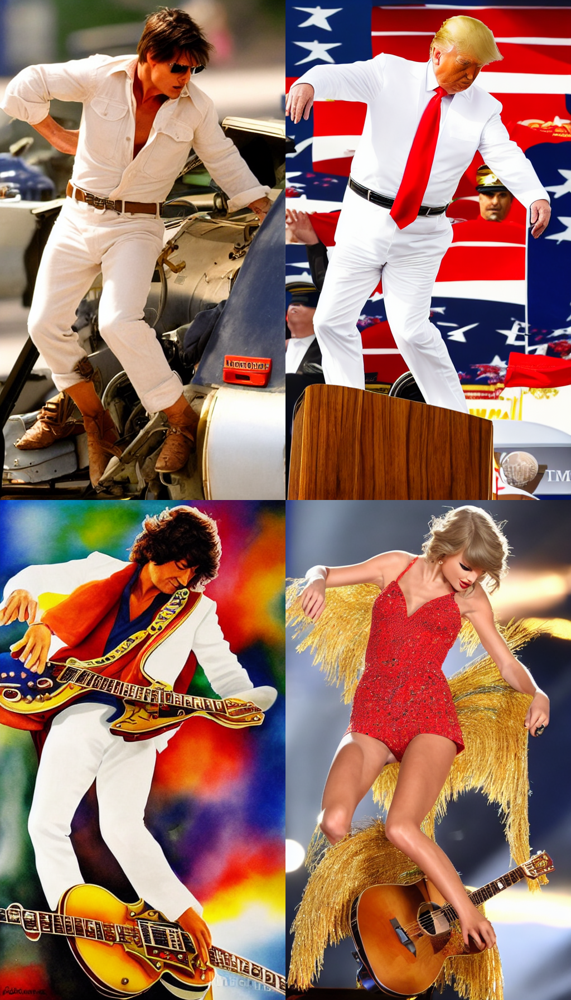

In [17]:
prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Tom Cruise", "Donald Trump", "jimmy page", "taylor swift"]]
generator = [torch.Generator(device="cpu").manual_seed(3) for i in range(len(prompt))]

output = pipe(
    prompt,
    poses,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * len(prompt),
    generator=generator,
    num_inference_steps=40,
)

image_grid(output.images, 2, 2)

  0%|          | 0/20 [00:00<?, ?it/s]

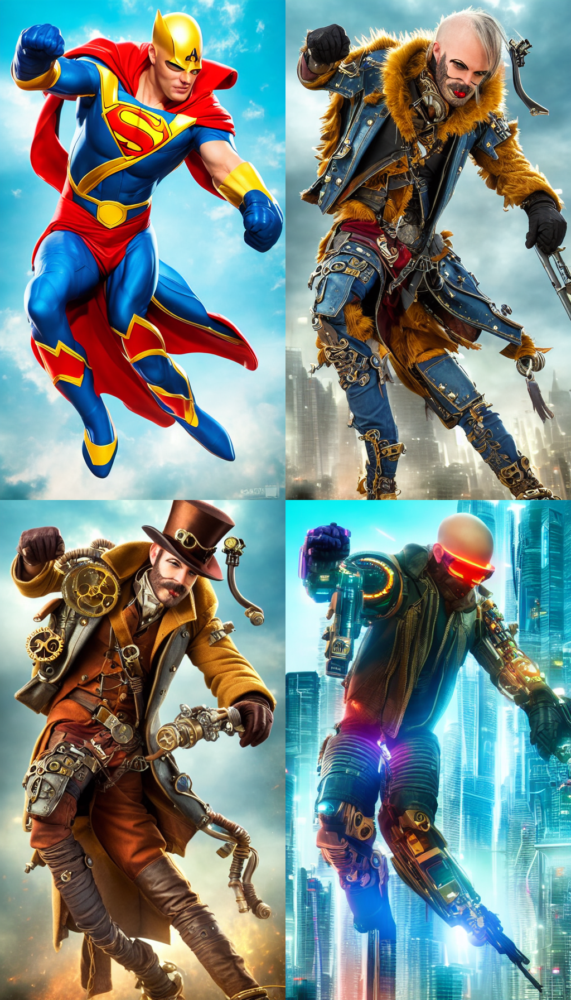

In [18]:
generator = [torch.Generator(device="cpu").manual_seed(2) for i in range(4)]
prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["super-hero character", "steelpunk character", "steampunk character", "cyberpunk character"]]

# prompt = "super-hero character, best quality, extremely detailed"
output = pipe(
    prompt,
    poses,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * 4,
    generator=generator,
    num_inference_steps=20,
)
image_grid(output.images, 2, 2)

## Scribble to Image

In [19]:
!pip install gradio -q #gradio isn't required to be mentioned on requirements for apps on HF space
!sudo apt-get install aria2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.8/15.8 MB 79.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 KB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 KB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 KB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.5/106.5 KB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.9/140.9 KB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 KB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 KB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 21.1 MB/s eta 0

In [20]:
#use aria instead of git lfs to download the pth files
#VIMP - cant use git lfs to download single files
!git clone https://github.com/lllyasviel/ControlNet.git
import os
%store -r

root_dir = "/content"
%store root_dir
repo_dir = str(root_dir)+"/ControlNet"
%store repo_dir
models_dir = str(root_dir)+"/ControlNet/models"
%store models_dir

%cd {root_dir}

installModels = []
installv2Models = []


modelUrl = ["", \
             "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_depth.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_hed.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_mlsd.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_normal.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_openpose.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_scribble.pth", \
            "https://huggingface.co/lllyasviel/ControlNet/resolve/main/models/control_sd15_seg.pth"]
modelList = ["", \
             "control_sd15_depth", \
             "control_sd15_hed", \
             "control_sd15_mlsd", \
             "control_sd15_normal", \
             "control_sd15_openpose", \
             "control_sd15_scribble", \
             "control_sd15_seg" ]
modelName = "control_sd15_scribble"  #change this to the model we want

if modelName != "":
  installModels.append((modelName, modelUrl[modelList.index(modelName)]))

def install(checkpoint_name, url):
  ext = "pth" if url.endswith(".pth") else "pt"

  hf_token = '' 
  user_header = f"\"Authorization: Bearer {hf_token}\""
  !aria2c --console-log-level=error --summary-interval=10 --header={user_header} -c -x 16 -k 1M -s 16 -d {repo_dir}/models -o {checkpoint_name}.{ext} "{url}"

def install_checkpoint():
  for model in installModels:
    install(model[0], model[1])

install_checkpoint()

Cloning into 'ControlNet'...
remote: Enumerating objects: 1264, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 1264 (delta 6), reused 4 (delta 0), pack-reused 1252
Receiving objects: 100% (1264/1264), 122.36 MiB | 11.18 MiB/s, done.
Resolving deltas: 100% (547/547), done.
Stored 'root_dir' (str)
Stored 'repo_dir' (str)
Stored 'models_dir' (str)
 *** Download Progress Summary as of Sun Mar 19 22:02:37 2023 *** 
=
[#b35a99 4.3GiB/5.3GiB(82%) CN:16 DL:449MiB ETA:2s]
FILE: /content/ControlNet/models/control_sd15_scribble.pth
-


Download Results:
gid   |stat|avg speed  |path/URI
======+====+===========+=======================================================
b35a99|OK  |   358MiB/s|/content/ControlNet/models/control_sd15_scribble.pth

Status Legend:
(OK):download completed.


In [21]:
# installing required libs for scribble to image
!pip install share
!pip install pytorch-lightning==1.9.1
!pip install einops==0.3.0
!pip install open_clip_torch==2.0.2
!pip install omegaconf==2.1.1
!pip install transformers==4.19.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for share: filename=share-1.0.4-py3-none-any.whl size=8978 sha256=c9a34ebf928037c4d56392ae49cfc8a0193e6683e3224ffeb266886cdf764d5d
  Stored in directory: /root/.cache/pip/wheels/ce/e1/22/59b49359f23749cb05c014b8aced2241be4b3fe6babd947dc9
Successfully built share
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.8/825.8 KB 43.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 KB 45.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: einops
    Found existing installation: einops 0.6.0
    Uninstalling einops-0.6.0:
      Successfully uninstalled einops-0.6.0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 28.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 7.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 KB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 KB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141229 sha256=f1518039d39bf216594294f263b4eee62603cc82c884c1f4257ce6c73a749303
  Stored in directory: /root/.cache/pip/wheels/42/3c/ae/14db087e6018de74810afe32eb6ac890ef9c68ba19b00db97a
Successfully built antlr4-python3-runtime


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 87.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 100.1 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.13.2
    Uninstalling tokenizers-0.13.2:
      Successfully uninstalled tokenizers-0.13.2
  Attempting uninstall: transformers
    Found existing installation: transformers 4.27.1
    Uninstalling transformers-4.27.1:
      Successfully uninstalled transformers-4.27.1


In [22]:
# scribble to image implementation code
import sys
sys.path.append('/content/ControlNet/')
from share import *
import config

import cv2
import einops
import gradio as gr
import numpy as np
import torch
import random

from pytorch_lightning import seed_everything
from annotator.util import resize_image, HWC3
from cldm.model import create_model, load_state_dict
from cldm.ddim_hacked import DDIMSampler


model = create_model('./ControlNet/models/cldm_v15.yaml').cpu()
model.load_state_dict(load_state_dict('./ControlNet/models/control_sd15_scribble.pth', location='cuda'))
model = model.cuda()
ddim_sampler = DDIMSampler(model)


def process(input_image, prompt, a_prompt, n_prompt, num_samples, image_resolution, ddim_steps, guess_mode, strength, scale, seed, eta):
    with torch.no_grad():
        img = resize_image(HWC3(input_image), image_resolution)
        H, W, C = img.shape

        detected_map = np.zeros_like(img, dtype=np.uint8)
        detected_map[np.min(img, axis=2) < 127] = 255

        control = torch.from_numpy(detected_map.copy()).float().cuda() / 255.0
        control = torch.stack([control for _ in range(num_samples)], dim=0)
        control = einops.rearrange(control, 'b h w c -> b c h w').clone()

        if seed == -1:
            seed = random.randint(0, 65535)
        seed_everything(seed)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=False)

        cond = {"c_concat": [control], "c_crossattn": [model.get_learned_conditioning([prompt + ', ' + a_prompt] * num_samples)]}
        un_cond = {"c_concat": None if guess_mode else [control], "c_crossattn": [model.get_learned_conditioning([n_prompt] * num_samples)]}
        shape = (4, H // 8, W // 8)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=True)

        model.control_scales = [strength * (0.825 ** float(12 - i)) for i in range(13)] if guess_mode else ([strength] * 13)  # Magic number. IDK why. Perhaps because 0.825**12<0.01 but 0.826**12>0.01
        samples, intermediates = ddim_sampler.sample(ddim_steps, num_samples,
                                                     shape, cond, verbose=False, eta=eta,
                                                     unconditional_guidance_scale=scale,
                                                     unconditional_conditioning=un_cond)

        if config.save_memory:
            model.low_vram_shift(is_diffusing=False)

        x_samples = model.decode_first_stage(samples)
        x_samples = (einops.rearrange(x_samples, 'b c h w -> b h w c') * 127.5 + 127.5).cpu().numpy().clip(0, 255).astype(np.uint8)

        results = [x_samples[i] for i in range(num_samples)]
    return [255 - detected_map] + results

/usr/local/lib/python3.9/dist-packages/pytorch_lightning/utilities/distributed.py:258: LightningDeprecationWarning: `pytorch_lightning.utilities.distributed.rank_zero_only` has been deprecated in v1.8.1 and will be removed in v2.0.0. You can import it from `pytorch_lightning.utilities` instead.
  rank_zero_deprecation(


ControlLDM: Running in eps-prediction mode
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.21.layer_norm2.bias', 'vision_model.encoder.layers.4.self_attn.v_proj.bias', 'vision_model.encoder.layers.1.self_attn.out_proj.bias', 'vision_model.encoder.layers.23.mlp.fc2.weight', 'vision_model.encoder.layers.2.self_attn.out_proj.bias', 'vision_model.encoder.layers.11.self_attn.k_proj.bias', 'vision_model.encoder.layers.4.mlp.fc1.weight', 'vision_model.encoder.layers.2.mlp.fc2.weight', 'vision_model.encoder.layers.5.self_attn.q_proj.bias', 'vision_model.encoder.layers.19.layer_norm1.bias', 'vision_model.encoder.layers.4.self_attn.out_proj.weight', 'vision_model.encoder.layers.7.layer_norm1.bias', 'vision_model.encoder.layers.0.self_attn.v_proj.bias', 'vision_model.encoder.layers.3.self_attn.v_proj.weight', 'vision_model.encoder.layers.21.self_attn.k_proj.weight', 'vision_model.encoder.layers.0.self_attn.out_proj.bias', 'vision_model.encod

Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 320, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 640, context_dim is 768 and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is None and using 8 heads.
Setting up MemoryEfficientCrossAttention. Query dim is 1280, context_dim is 768 and using 8 heads.
Setting up Me

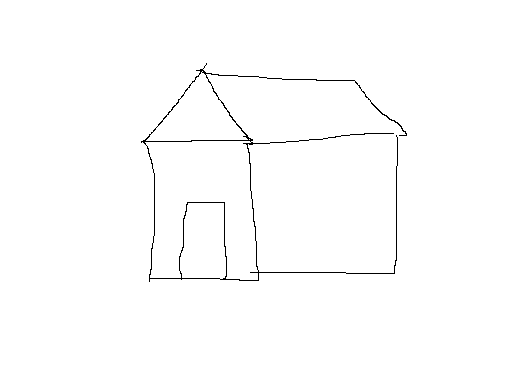

In [23]:
image = load_image(
    "/content/house_scribble.png"
)
image

In [24]:
# process(input_image, prompt, a_prompt, n_prompt, num_samples, image_resolution, ddim_steps, guess_mode, strength, scale, seed, eta)
processed_img = process(np.array(image), "funky house on the beach", "best quality, extremely detailed", \
        "longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality", \
        2, 512, 20, False, 1.0, 9.0, 1, 0.0)


INFO:lightning_fabric.utilities.seed:Global seed set to 1


Data shape for DDIM sampling is (2, 4, 64, 88), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:06<00:00,  3.16it/s]


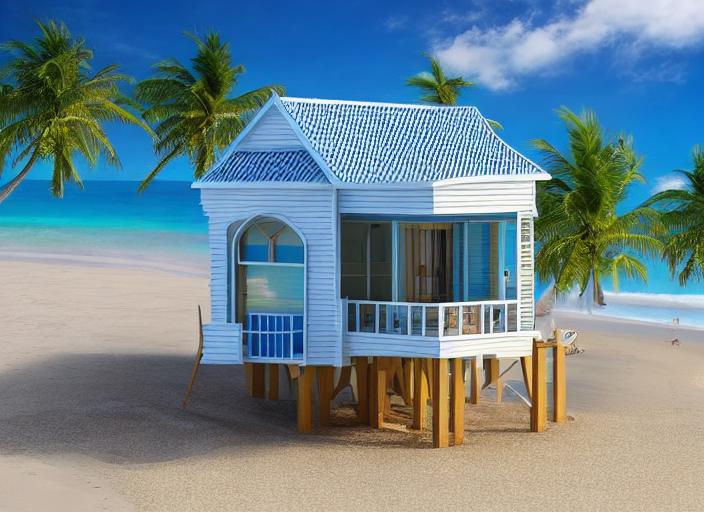

In [25]:
Image.fromarray(np.array(processed_img[1]), 'RGB')

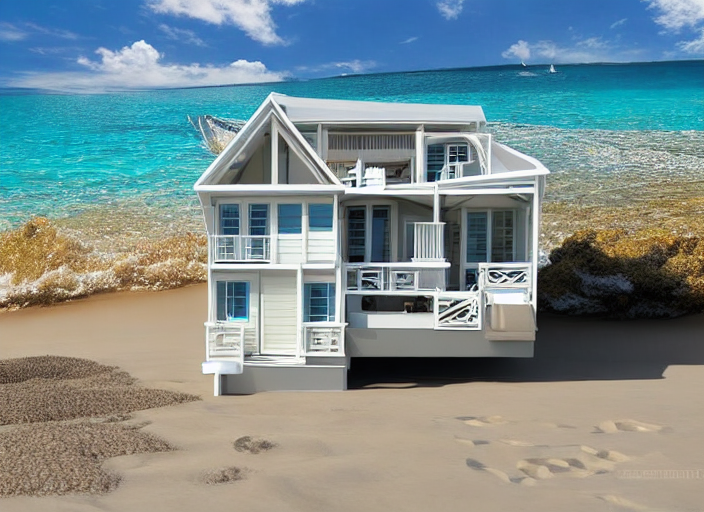

In [26]:
Image.fromarray(np.array(processed_img[2]), 'RGB')

## Using Guess Mode of ControlNet

In [27]:
# process(input_image, prompt, a_prompt, n_prompt, num_samples, image_resolution, ddim_steps, guess_mode, strength, scale, seed, eta)
processed_img = process(np.array(image), "", "best quality, extremely detailed", \
        "longbody, lowres, bad anatomy, bad hands, missing fingers, extra digit, fewer digits, cropped, worst quality, low quality", \
        2, 512, 20, True, 1.0, 9.0, 1, 0.0)


INFO:lightning_fabric.utilities.seed:Global seed set to 1


Data shape for DDIM sampling is (2, 4, 64, 88), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:05<00:00,  3.73it/s]


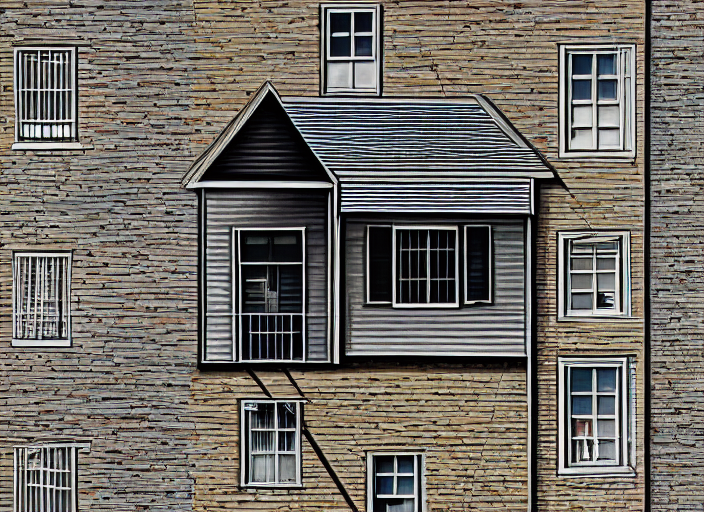

In [28]:
Image.fromarray(np.array(processed_img[1]), 'RGB')

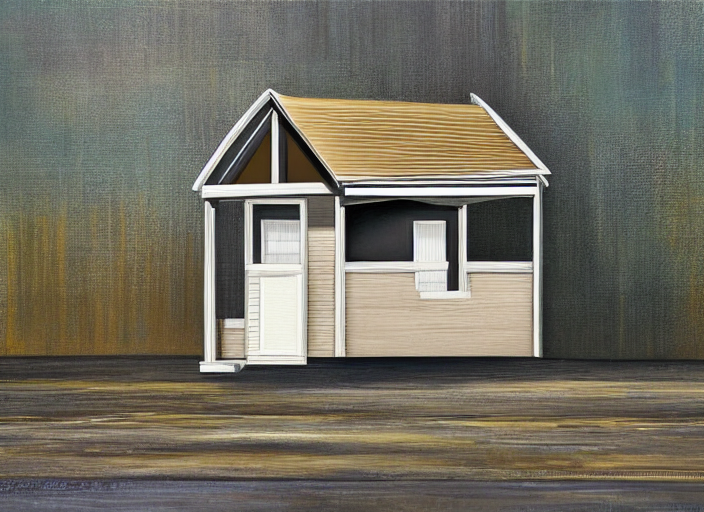

In [29]:
Image.fromarray(np.array(processed_img[2]), 'RGB')